In [14]:
import numpy as np
import scipy.io.wavfile as wav
import IPython
# audiolab may not be compatible with Python 3
import scikits.audiolab
import sys, glob
from ica import ica
import matplotlib.pylab as plt
%matplotlib inline

/Users/patrickc/anaconda3/envs/python2/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


## Read the `wav` files.

In [15]:
# Read the wav files
files= glob.glob('../../docs/initialpitch/wavs/labmates/recording-*.wav')
source = []
for i,filename in enumerate(files):
    (rate,sig) = wav.read(filename)
    if len(sig.shape)==2:
        sig =sig[:,0].astype(np.float64)/sig[:,0].max()
    source+=[sig]
source = np.array(source)

## Create a fake channel

In [20]:
A = np.random.randn( len(source), len(source) )
A -= A.min()
A /= A.max()

# Mixed signals together
X = A.dot(source)

## Do ICA on signals

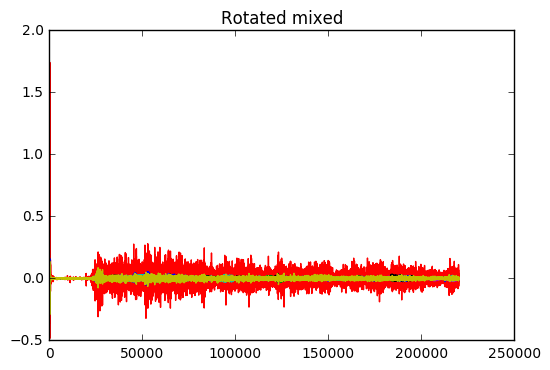

In [21]:
ivecs,m = ica(X, sigdim=1, n_components=len(X))
rX = (X.T-m).dot(ivecs).dot( np.linalg.inv(ivecs.T.dot(ivecs)))
plt.plot(rX)
plt.title('Rotated mixed')

In [ ]:
for i in range(len(rX.T)):
    IPython.display.display_markdown("Component {}".format(i), raw=True)
    scikits.audiolab.play(rX[:,i], fs=rate)
    IPython.display.clear_output(wait=True)

In [29]:
for i in range(len(rX.T)):
    print("Component {}".format(i))
    IPython.display.display(IPython.display.Audio(data=rX[:,i], rate=rate))

Component 0


Component 1


Component 2


Component 3


Component 4


Component 5


Component 6


Component 7


Component 8


Component 9


Component 10


Component 11


Component 12


Component 13


Component 14


Component 15


Component 16


Component 17


Component 18


Component 19
